In [2]:
import pandas as pd
import geopandas as gp
import matplotlib.pyplot as plt

# Import data

In [3]:
metadata = pd.read_csv('/Users/yujun/Data/global_streetscapes/cities688_all_standard/tables/metadata_common_attributes.csv')[['uuid', 'source', 'orig_id', 'lat', 'lon', 'sequence_id']]
metadata.info(verbose=True, show_counts=True)

/Users/yujun/opt/anaconda3/envs/ox/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (13) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9236492 entries, 0 to 9236491
Data columns (total 6 columns):
 #   Column       Non-Null Count    Dtype  
---  ------       --------------    -----  
 0   uuid         9236492 non-null  object 
 1   source       9236492 non-null  object 
 2   orig_id      9236492 non-null  int64  
 3   lat          9236492 non-null  float64
 4   lon          9236492 non-null  float64
 5   sequence_id  9236492 non-null  object 
dtypes: float64(2), int64(1), object(3)
memory usage: 422.8+ MB


In [4]:
sm = pd.read_csv('/Users/yujun/Data/global_streetscapes/cities688_all_standard/tables/simplemaps.csv')[['uuid', 'city', 'city_id']]
sm.info(verbose=True, show_counts=True)

/Users/yujun/opt/anaconda3/envs/ox/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (12) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9236492 entries, 0 to 9236491
Data columns (total 3 columns):
 #   Column   Non-Null Count    Dtype 
---  ------   --------------    ----- 
 0   uuid     9236492 non-null  object
 1   city     9236492 non-null  object
 2   city_id  9236492 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 211.4+ MB


In [5]:
metadata = metadata.merge(sm, on='uuid', how='left')

In [6]:
sm = 0

In [9]:
metadata.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9236492 entries, 0 to 9236491
Data columns (total 8 columns):
 #   Column       Non-Null Count    Dtype  
---  ------       --------------    -----  
 0   uuid         9236492 non-null  object 
 1   source       9236492 non-null  object 
 2   orig_id      9236492 non-null  int64  
 3   lat          9236492 non-null  float64
 4   lon          9236492 non-null  float64
 5   sequence_id  9236492 non-null  object 
 6   city         9236492 non-null  object 
 7   city_id      9236492 non-null  int64  
dtypes: float64(2), int64(2), object(4)
memory usage: 634.2+ MB


In [10]:
cities = pd.read_csv('/Users/yujun/Data/global_streetscapes/cities688_all_standard/svi_count_by_city_updated.csv')
cities

,city,city_ascii,city_id,city_lat,city_lon,country,iso2,iso3,admin_name,capital,population,continent,img_count
0,Urasoe,Urasoe,1392003314,26.2458,127.7219,Japan,JP,JPN,Okinawa,NaN,115855.0,Asia,4942
1,Sasagawa,Sasagawa,1392742964,37.2865,140.3727,Japan,JP,JPN,Fukushima,NaN,75128.0,Asia,9683
2,Nha Trang,Nha Trang,1704497901,12.2495,109.1908,Vietnam,VN,VNM,Khánh Hòa,admin,392279.0,Asia,1295
3,Sandakan,Sandakan,1458405180,5.8388,118.1173,Malaysia,MY,MYS,Sabah,NaN,396290.0,Asia,1
4,Serrinha,Serrinha,1076832200,-11.6639,-39.0078,Brazil,BR,BRA,Bahia,NaN,83275.0,South America,126
...,...,...,...,...,...,...,...,...,...,...,...,...,...
683,Sliedrecht,Sliedrecht,1528494904,51.8222,4.7744,Netherlands,NL,NLD,Zuid-Holland,minor,25026.0,Europe,5646
684,Richmond,Richmond,1826875300,51.4560,-0.3010,United Kingdom,GB,GBR,Richmond upon Thames,NaN,21469.0,Europe,823
685,Sungurlu,Sungurlu,1792574243,40.1610,34.3770,Turkey,TR,TUR,Çorum,minor,12886.0,Asia,38
686,Oberengstringen,Oberengstringen,1756730955,47.4103,8.4633,Switzerland,CH,CHE,Zürich,NaN,6569.0,Europe,5702


In [9]:
cities[cities['city']=='Sydney']

,city,city_ascii,city_id,city_lat,city_lon,country,iso2,iso3,admin_name,capital,population,continent,img_count
570,Sydney,Sydney,1036074917,-33.865,151.2094,Australia,AU,AUS,New South Wales,admin,4840600.0,Oceania,74350


In [34]:
points = gp.GeoDataFrame(
    metadata, 
    geometry=gp.points_from_xy(metadata.lon, metadata.lat),
    crs="EPSG:4326"
)

# Geographical coverage - global

## Points

In [6]:
gdf = gp.GeoDataFrame(
    metadata, 
    geometry=gp.points_from_xy(metadata.lon, metadata.lat),
    crs="EPSG:4326"
)

<AxesSubplot:>

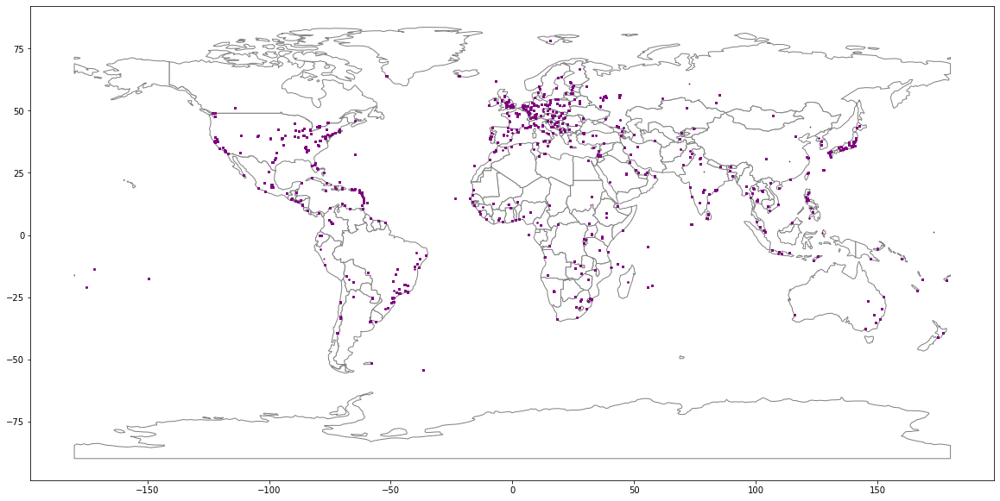

In [7]:
# create Matplotlib figure
fig, ax = plt.subplots(figsize=(20,20))

#ax.set_facecolor('black')

world = gp.read_file(gp.datasets.get_path('naturalearth_lowres'))
world.plot(ax=ax, color='white', edgecolor='grey')

# plot points on Axis ax
gdf.plot(ax=ax, marker='o', color='purple', markersize=0.5, alpha=0.5)

# Coverage per city

In [17]:
import mpmath as mp
import math

def get_tile(lat_deg, lon_deg, zoom):
    '''A function to get the relevant tile from lat,lon,zoom)'''
    lat_rad = mp.radians(lat_deg)
    n = 2 ** zoom
    xtile = n * ((lon_deg + 180) / 360)
    ytile = n * (1 - (mp.log(mp.tan(lat_rad) + mp.sec(lat_rad)) / mp.pi)) / 2
    return (zoom, math.floor(xtile), math.floor(ytile))


def tile2lon(z, x, y):
    return x / 2**z * 360 - 180


def tile2lat(z, x, y):
    n = mp.pi - 2 * mp.pi * y / 2**z
    return float((180 / mp.pi) * (mp.atan(0.5 * (mp.exp(n) - mp.exp(-n)))))


def tile_bbox(z, x, y):
    '''Return the bounding box of a tile'''
    w = tile2lon(z, x, y)
    n = tile2lat(z, x, y)
    e = tile2lon(z, x+1, y)
    s = tile2lat(z, x, y+1)
    return [w, n, e, s]


def get_bbox(lat, lon, zoom):
    (z, x, y) = get_tile(lat, lon, zoom)
    [w, n, e, s] = tile_bbox(z, x, y)
    return [w, n, e, s]


In [19]:
cities['left'] = cities.apply(lambda row: get_bbox(row['city_lat'], row['city_lon'], 14)[0], axis=1)
cities['top'] = cities.apply(lambda row: get_bbox(row['city_lat'], row['city_lon'], 14)[1], axis=1)
cities['right'] = cities.apply(lambda row: get_bbox(row['city_lat'], row['city_lon'], 14)[2], axis=1)
cities['bottom'] = cities.apply(lambda row: get_bbox(row['city_lat'], row['city_lon'], 14)[3], axis=1)

In [22]:
from shapely.geometry import box
geometry = [box(x1,y1,x2,y2) for x1,y1,x2,y2 in zip(cities.left, cities.bottom, cities.right, cities.top)]
boxes = gp.GeoDataFrame(cities, geometry=geometry)

<AxesSubplot:>

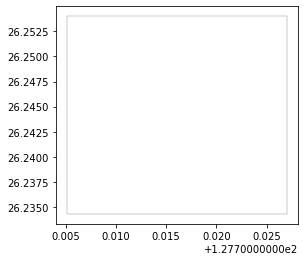

In [32]:
boxes.loc[[0],'geometry'].plot(facecolor="none", edgecolor='grey', lw=0.4)

## n = 0

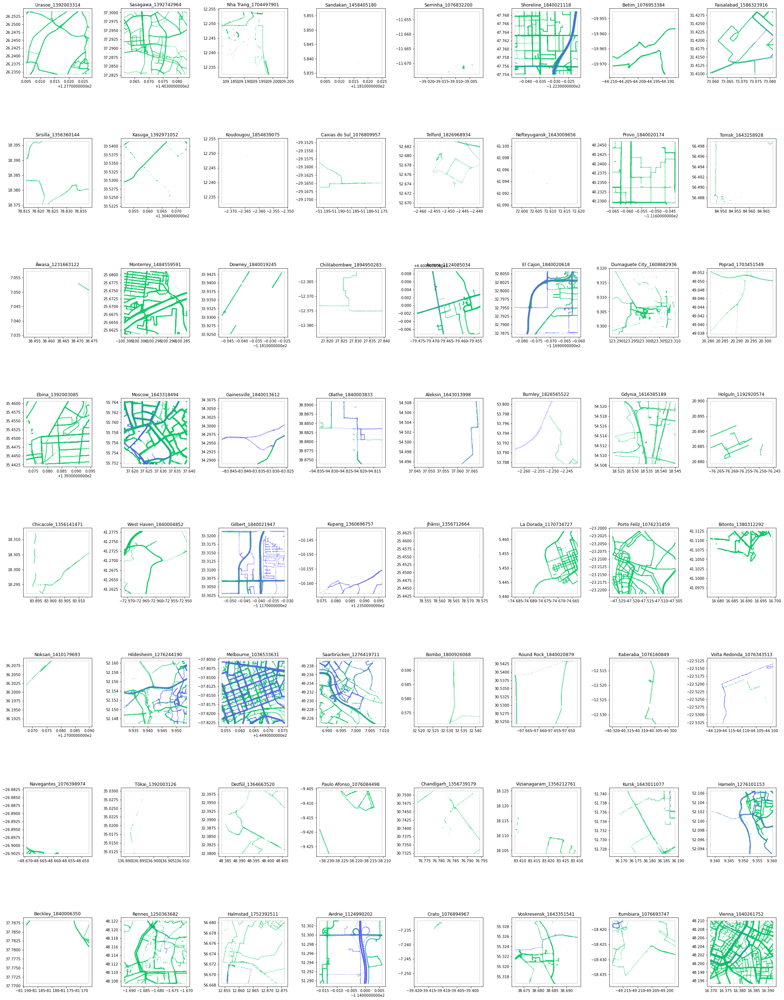

In [53]:
nrow, ncol = 8, 8
total = len(cities)
batch = nrow*ncol 
n = 0
start = n*batch
end = (n+1)*batch
if n == 11:
    end = None
df_batch = boxes.iloc[start:end]
print()

fig, axes = plt.subplots(nrow, ncol, figsize=(30, 40))

# Plot data for each attribute in a 3x3 grid with the corrected order
i = 0
for idx, box in df_batch.iterrows():
    
    city = box['city']
    city_id = box['city_id']

    # Determine the current subplot's row and column
    row, col = divmod(i, ncol)
    
    #print(f"idx: {idx}, row: {row}, col: {col}")
    
    boxes.loc[[idx], 'geometry'].plot(ax=axes[row, col], facecolor="none", edgecolor='grey', lw=0.4)
    
    points_sub = points[points['city_id'] == city_id]
    
    # points_sub.plot(ax=axes[row, col], 
    #          column='source', 
    #          cmap='Spectral',
    #          alpha=0.3, 
    #          markersize=0.3)
    
    mly = points_sub[points_sub['source'] == 'Mapillary']
    kv = points_sub[points_sub['source'] == 'KartaView']
    if mly.empty==False and kv.empty==False:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==True and kv.empty==False:
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==False and kv.empty==True:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
    
    # Set title and labels
    axes[row, col].set_title(f"{city}_{city_id}")
    
    i += 1

# Adjust layout and display
plt.tight_layout()
plt.show()   

## n = 1

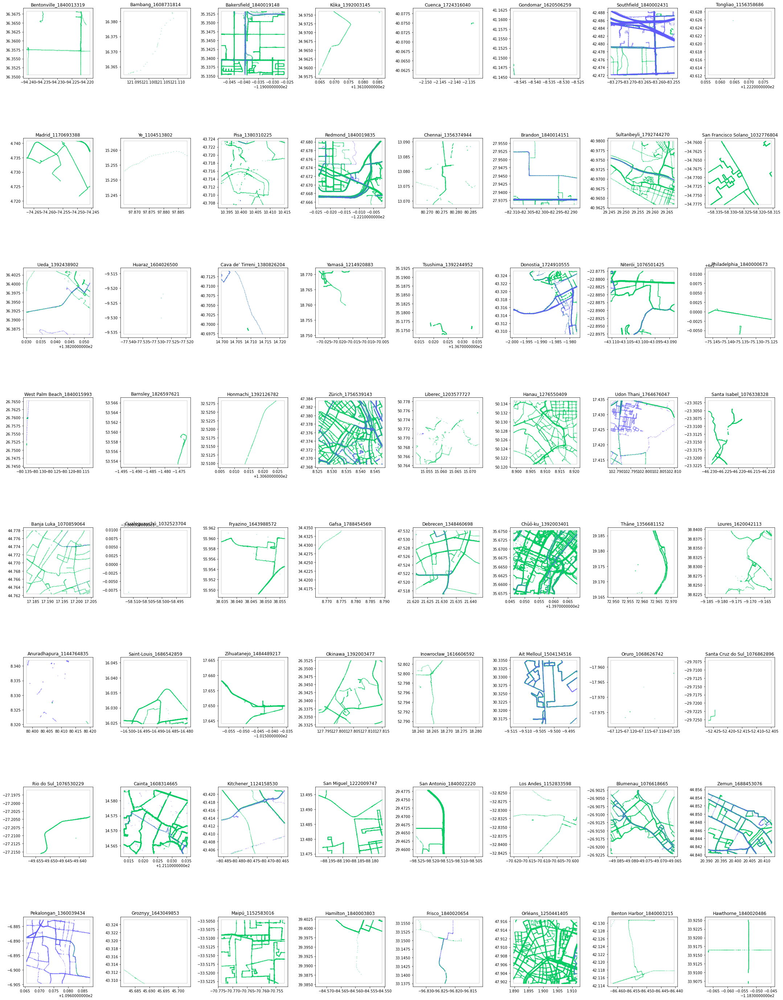

In [55]:
nrow, ncol = 8, 8
total = len(cities)
batch = nrow*ncol 
n = 1
start = n*batch
end = (n+1)*batch
if n == 11:
    end = None
df_batch = boxes.iloc[start:end]
print()

fig, axes = plt.subplots(nrow, ncol, figsize=(30, 40))

# Plot data for each attribute in a 3x3 grid with the corrected order
i = 0
for idx, box in df_batch.iterrows():
    
    city = box['city']
    city_id = box['city_id']

    # Determine the current subplot's row and column
    row, col = divmod(i, ncol)
    
    #print(f"idx: {idx}, row: {row}, col: {col}")
    
    boxes.loc[[idx], 'geometry'].plot(ax=axes[row, col], facecolor="none", edgecolor='grey', lw=0.4)
    
    points_sub = points[points['city_id'] == city_id]
    
    # points_sub.plot(ax=axes[row, col], 
    #          column='source', 
    #          cmap='Spectral',
    #          alpha=0.3, 
    #          markersize=0.3)
    
    mly = points_sub[points_sub['source'] == 'Mapillary']
    kv = points_sub[points_sub['source'] == 'KartaView']
    if mly.empty==False and kv.empty==False:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==True and kv.empty==False:
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==False and kv.empty==True:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
    
    # Set title and labels
    axes[row, col].set_title(f"{city}_{city_id}")
    
    i += 1

# Adjust layout and display
plt.tight_layout()
plt.show()   

## n = 2

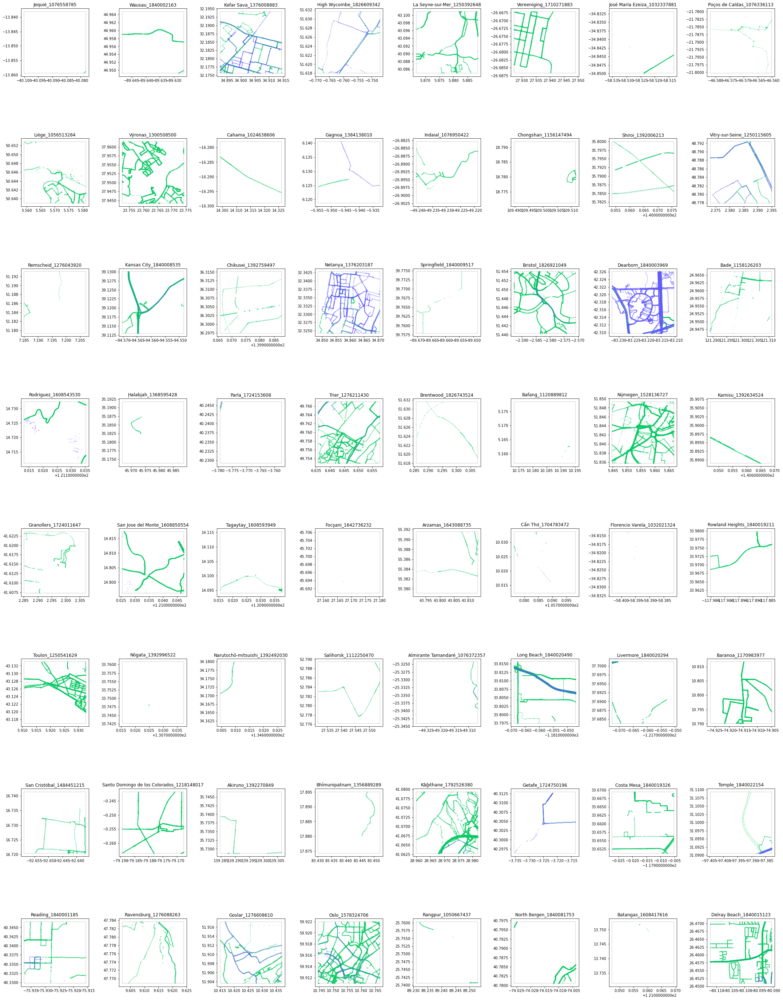

In [56]:
nrow, ncol = 8, 8
total = len(cities)
batch = nrow*ncol 
n = 2
start = n*batch
end = (n+1)*batch
if n == 11:
    end = None
df_batch = boxes.iloc[start:end]
print()

fig, axes = plt.subplots(nrow, ncol, figsize=(30, 40))

# Plot data for each attribute in a 3x3 grid with the corrected order
i = 0
for idx, box in df_batch.iterrows():
    
    city = box['city']
    city_id = box['city_id']

    # Determine the current subplot's row and column
    row, col = divmod(i, ncol)
    
    #print(f"idx: {idx}, row: {row}, col: {col}")
    
    boxes.loc[[idx], 'geometry'].plot(ax=axes[row, col], facecolor="none", edgecolor='grey', lw=0.4)
    
    points_sub = points[points['city_id'] == city_id]
    
    # points_sub.plot(ax=axes[row, col], 
    #          column='source', 
    #          cmap='Spectral',
    #          alpha=0.3, 
    #          markersize=0.3)
    
    mly = points_sub[points_sub['source'] == 'Mapillary']
    kv = points_sub[points_sub['source'] == 'KartaView']
    if mly.empty==False and kv.empty==False:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==True and kv.empty==False:
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==False and kv.empty==True:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
    
    # Set title and labels
    axes[row, col].set_title(f"{city}_{city_id}")
    
    i += 1

# Adjust layout and display
plt.tight_layout()
plt.show()   

## n = 3

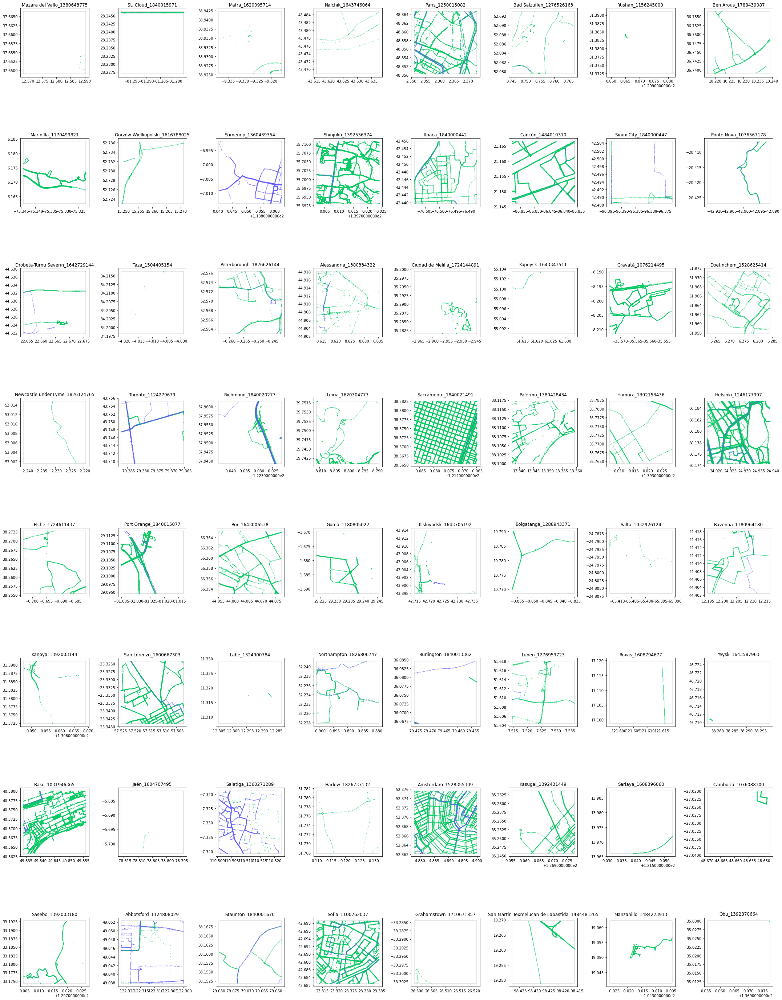

In [57]:
nrow, ncol = 8, 8
total = len(cities)
batch = nrow*ncol 
n = 3
start = n*batch
end = (n+1)*batch
if n == 11:
    end = None
df_batch = boxes.iloc[start:end]
print()

fig, axes = plt.subplots(nrow, ncol, figsize=(30, 40))

# Plot data for each attribute in a 3x3 grid with the corrected order
i = 0
for idx, box in df_batch.iterrows():
    
    city = box['city']
    city_id = box['city_id']

    # Determine the current subplot's row and column
    row, col = divmod(i, ncol)
    
    #print(f"idx: {idx}, row: {row}, col: {col}")
    
    boxes.loc[[idx], 'geometry'].plot(ax=axes[row, col], facecolor="none", edgecolor='grey', lw=0.4)
    
    points_sub = points[points['city_id'] == city_id]
    
    # points_sub.plot(ax=axes[row, col], 
    #          column='source', 
    #          cmap='Spectral',
    #          alpha=0.3, 
    #          markersize=0.3)
    
    mly = points_sub[points_sub['source'] == 'Mapillary']
    kv = points_sub[points_sub['source'] == 'KartaView']
    if mly.empty==False and kv.empty==False:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==True and kv.empty==False:
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==False and kv.empty==True:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
    
    # Set title and labels
    axes[row, col].set_title(f"{city}_{city_id}")
    
    i += 1

# Adjust layout and display
plt.tight_layout()
plt.show()   

## n = 4

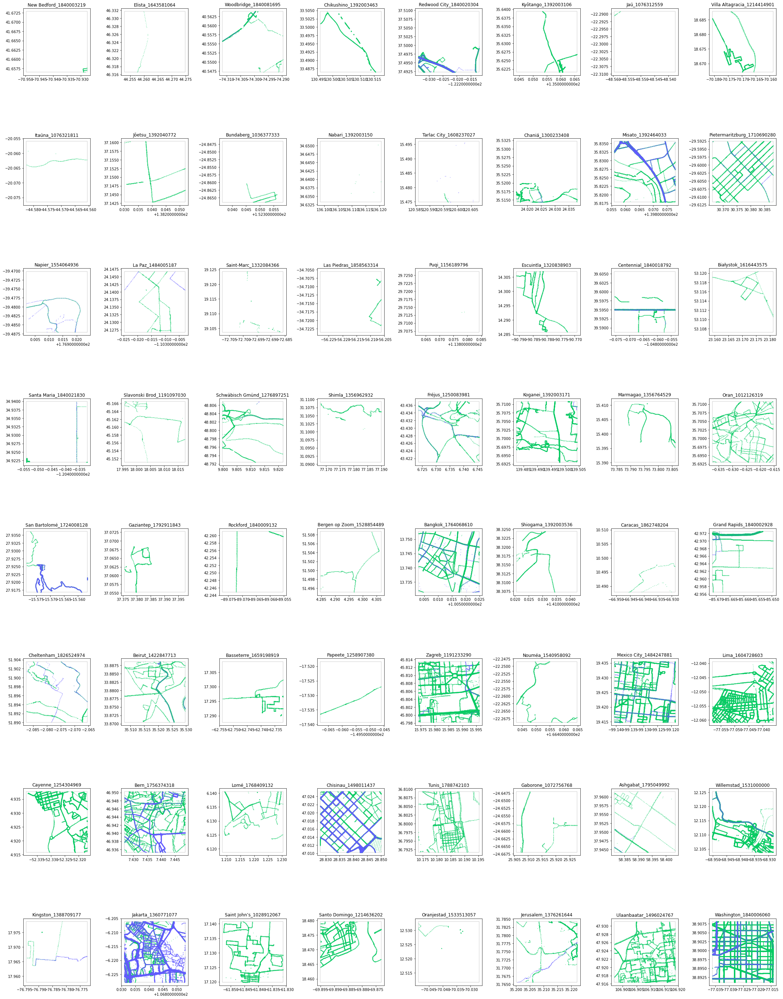

In [58]:
nrow, ncol = 8, 8
total = len(cities)
batch = nrow*ncol 
n = 4
start = n*batch
end = (n+1)*batch
if n == 11:
    end = None
df_batch = boxes.iloc[start:end]
print()

fig, axes = plt.subplots(nrow, ncol, figsize=(30, 40))

# Plot data for each attribute in a 3x3 grid with the corrected order
i = 0
for idx, box in df_batch.iterrows():
    
    city = box['city']
    city_id = box['city_id']

    # Determine the current subplot's row and column
    row, col = divmod(i, ncol)
    
    #print(f"idx: {idx}, row: {row}, col: {col}")
    
    boxes.loc[[idx], 'geometry'].plot(ax=axes[row, col], facecolor="none", edgecolor='grey', lw=0.4)
    
    points_sub = points[points['city_id'] == city_id]
    
    # points_sub.plot(ax=axes[row, col], 
    #          column='source', 
    #          cmap='Spectral',
    #          alpha=0.3, 
    #          markersize=0.3)
    
    mly = points_sub[points_sub['source'] == 'Mapillary']
    kv = points_sub[points_sub['source'] == 'KartaView']
    if mly.empty==False and kv.empty==False:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==True and kv.empty==False:
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==False and kv.empty==True:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
    
    # Set title and labels
    axes[row, col].set_title(f"{city}_{city_id}")
    
    i += 1

# Adjust layout and display
plt.tight_layout()
plt.show()   

## n = 5

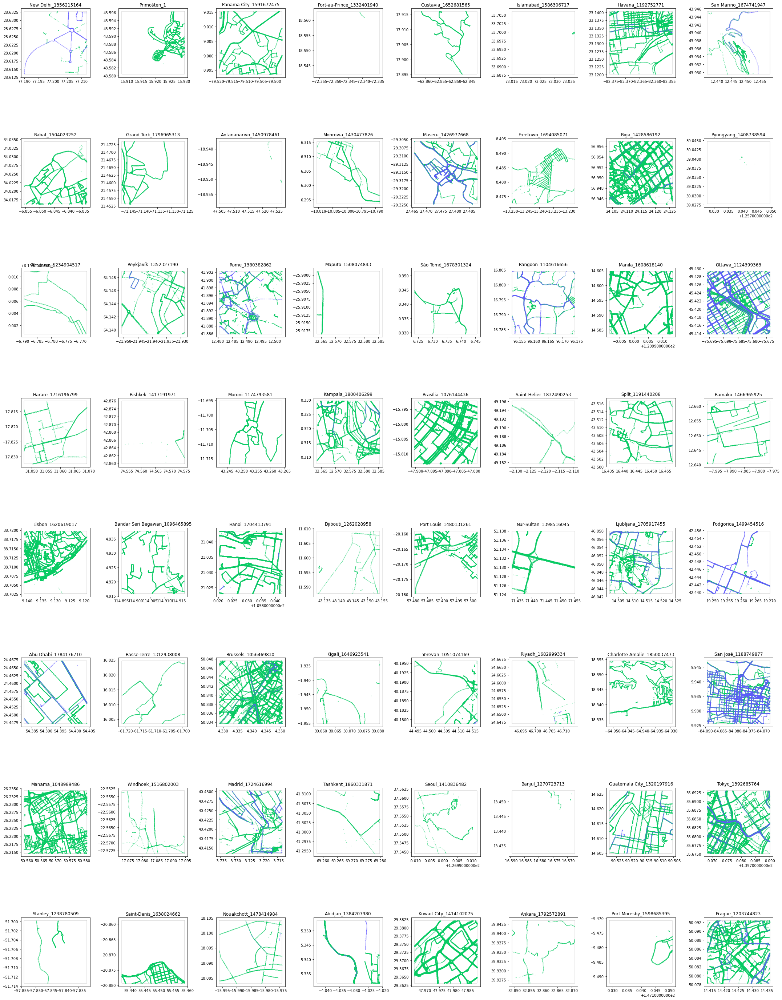

In [59]:
nrow, ncol = 8, 8
total = len(cities)
batch = nrow*ncol 
n = 5
start = n*batch
end = (n+1)*batch
if n == 11:
    end = None
df_batch = boxes.iloc[start:end]
print()

fig, axes = plt.subplots(nrow, ncol, figsize=(30, 40))

# Plot data for each attribute in a 3x3 grid with the corrected order
i = 0
for idx, box in df_batch.iterrows():
    
    city = box['city']
    city_id = box['city_id']

    # Determine the current subplot's row and column
    row, col = divmod(i, ncol)
    
    #print(f"idx: {idx}, row: {row}, col: {col}")
    
    boxes.loc[[idx], 'geometry'].plot(ax=axes[row, col], facecolor="none", edgecolor='grey', lw=0.4)
    
    points_sub = points[points['city_id'] == city_id]
    
    # points_sub.plot(ax=axes[row, col], 
    #          column='source', 
    #          cmap='Spectral',
    #          alpha=0.3, 
    #          markersize=0.3)
    
    mly = points_sub[points_sub['source'] == 'Mapillary']
    kv = points_sub[points_sub['source'] == 'KartaView']
    if mly.empty==False and kv.empty==False:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==True and kv.empty==False:
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==False and kv.empty==True:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
    
    # Set title and labels
    axes[row, col].set_title(f"{city}_{city_id}")
    
    i += 1

# Adjust layout and display
plt.tight_layout()
plt.show()   

## n = 6

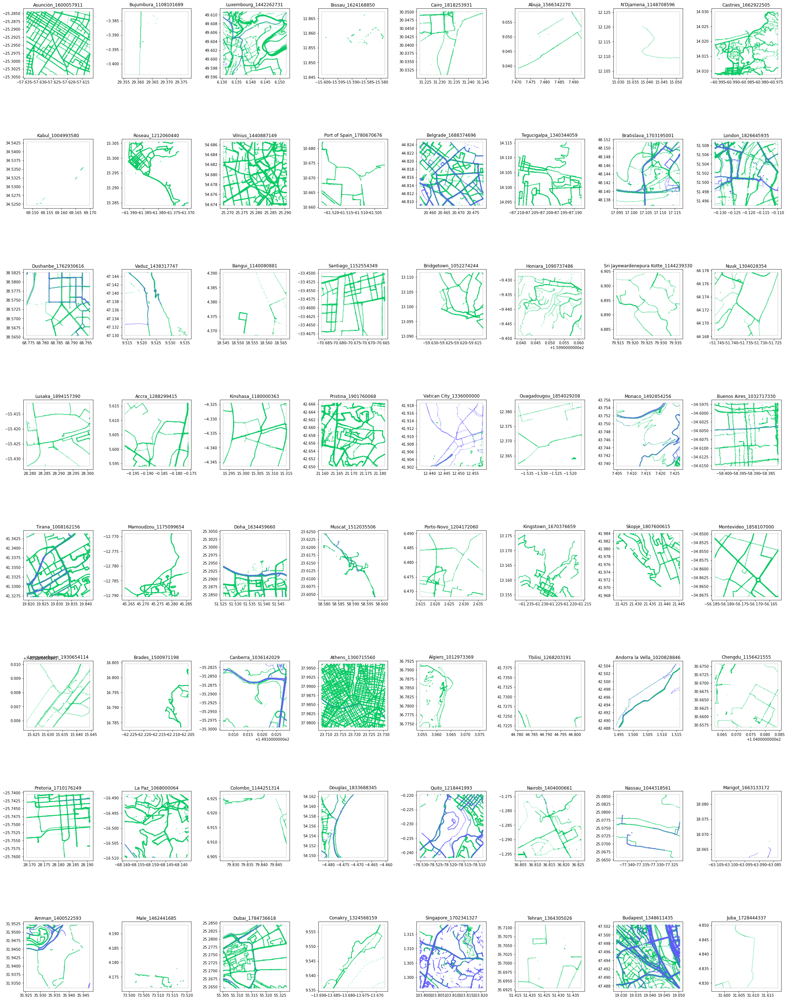

In [60]:
nrow, ncol = 8, 8
total = len(cities)
batch = nrow*ncol 
n = 6
start = n*batch
end = (n+1)*batch
if n == 11:
    end = None
df_batch = boxes.iloc[start:end]
print()

fig, axes = plt.subplots(nrow, ncol, figsize=(30, 40))

# Plot data for each attribute in a 3x3 grid with the corrected order
i = 0
for idx, box in df_batch.iterrows():
    
    city = box['city']
    city_id = box['city_id']

    # Determine the current subplot's row and column
    row, col = divmod(i, ncol)
    
    #print(f"idx: {idx}, row: {row}, col: {col}")
    
    boxes.loc[[idx], 'geometry'].plot(ax=axes[row, col], facecolor="none", edgecolor='grey', lw=0.4)
    
    points_sub = points[points['city_id'] == city_id]
    
    # points_sub.plot(ax=axes[row, col], 
    #          column='source', 
    #          cmap='Spectral',
    #          alpha=0.3, 
    #          markersize=0.3)
    
    mly = points_sub[points_sub['source'] == 'Mapillary']
    kv = points_sub[points_sub['source'] == 'KartaView']
    if mly.empty==False and kv.empty==False:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==True and kv.empty==False:
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==False and kv.empty==True:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
    
    # Set title and labels
    axes[row, col].set_title(f"{city}_{city_id}")
    
    i += 1

# Adjust layout and display
plt.tight_layout()
plt.show()   

## n = 7

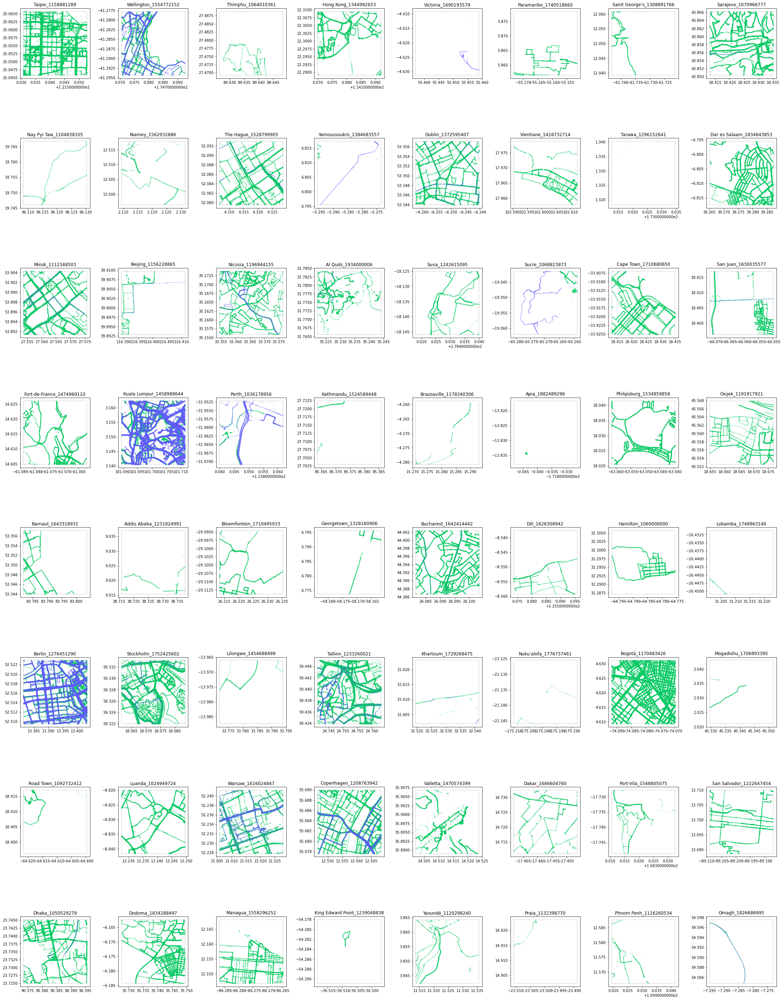

In [61]:
nrow, ncol = 8, 8
total = len(cities)
batch = nrow*ncol 
n = 7
start = n*batch
end = (n+1)*batch
if n == 11:
    end = None
df_batch = boxes.iloc[start:end]
print()

fig, axes = plt.subplots(nrow, ncol, figsize=(30, 40))

# Plot data for each attribute in a 3x3 grid with the corrected order
i = 0
for idx, box in df_batch.iterrows():
    
    city = box['city']
    city_id = box['city_id']

    # Determine the current subplot's row and column
    row, col = divmod(i, ncol)
    
    #print(f"idx: {idx}, row: {row}, col: {col}")
    
    boxes.loc[[idx], 'geometry'].plot(ax=axes[row, col], facecolor="none", edgecolor='grey', lw=0.4)
    
    points_sub = points[points['city_id'] == city_id]
    
    # points_sub.plot(ax=axes[row, col], 
    #          column='source', 
    #          cmap='Spectral',
    #          alpha=0.3, 
    #          markersize=0.3)
    
    mly = points_sub[points_sub['source'] == 'Mapillary']
    kv = points_sub[points_sub['source'] == 'KartaView']
    if mly.empty==False and kv.empty==False:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==True and kv.empty==False:
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==False and kv.empty==True:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
    
    # Set title and labels
    axes[row, col].set_title(f"{city}_{city_id}")
    
    i += 1

# Adjust layout and display
plt.tight_layout()
plt.show()   

## n = 8

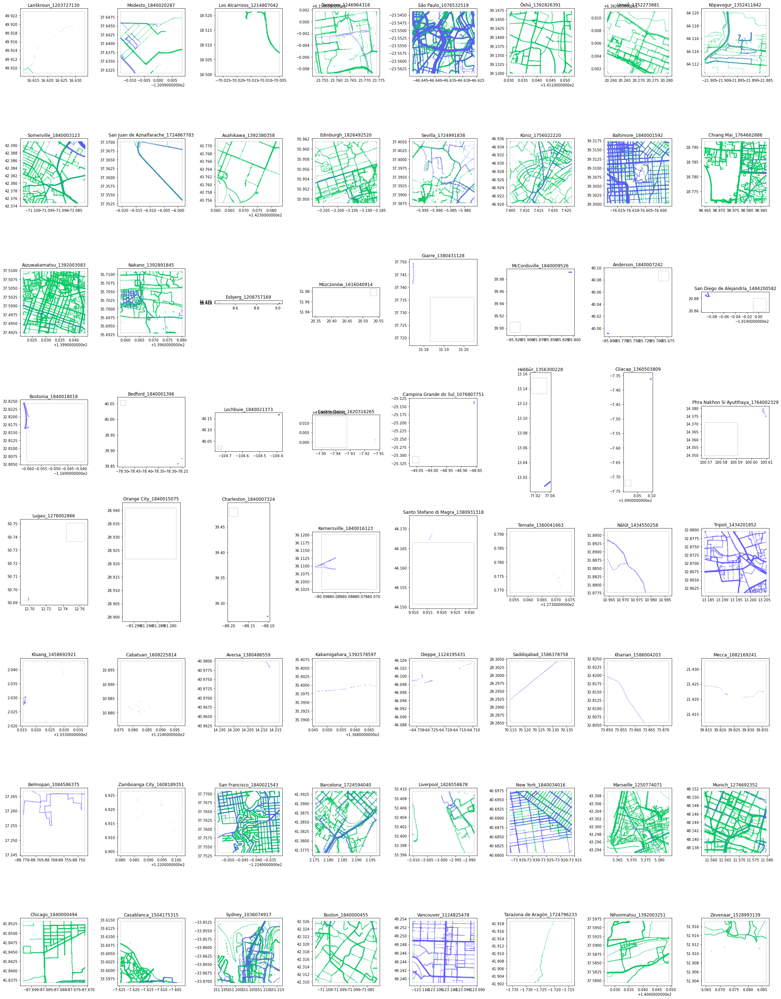

In [67]:
nrow, ncol = 8, 8
total = len(cities)
batch = nrow*ncol 
n = 8
start = n*batch
end = (n+1)*batch
if n == 11:
    end = None
df_batch = boxes.iloc[start:end]
print()

fig, axes = plt.subplots(nrow, ncol, figsize=(30, 40))

# Plot data for each attribute in a 3x3 grid with the corrected order
i = 0
for idx, box in df_batch.iterrows():
    
    city = box['city']
    city_id = box['city_id']

    # Determine the current subplot's row and column
    row, col = divmod(i, ncol)
    
    #print(f"idx: {idx}, row: {row}, col: {col}")
    
    boxes.loc[[idx], 'geometry'].plot(ax=axes[row, col], facecolor="none", edgecolor='grey', lw=0.4)
    
    points_sub = points[points['city_id'] == city_id]
    
    # points_sub.plot(ax=axes[row, col], 
    #          column='source', 
    #          cmap='Spectral',
    #          alpha=0.3, 
    #          markersize=0.3)
    
    mly = points_sub[points_sub['source'] == 'Mapillary']
    kv = points_sub[points_sub['source'] == 'KartaView']
    if mly.empty==False and kv.empty==False:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==True and kv.empty==False:
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==False and kv.empty==True:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
    
    # Set title and labels
    axes[row, col].set_title(f"{city}_{city_id}")
    
    i += 1

# Adjust layout and display
plt.tight_layout()
plt.show()   

## n = 9

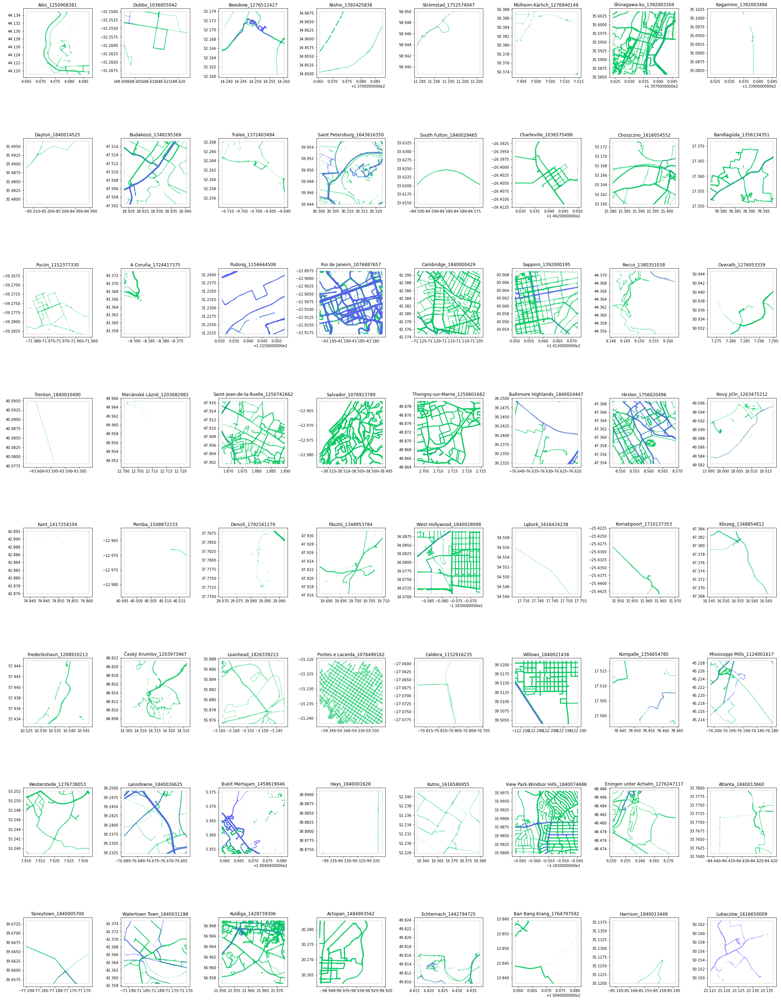

In [68]:
nrow, ncol = 8, 8
total = len(cities)
batch = nrow*ncol 
n = 9
start = n*batch
end = (n+1)*batch
if n == 11:
    end = None
df_batch = boxes.iloc[start:end]
print()

fig, axes = plt.subplots(nrow, ncol, figsize=(30, 40))

# Plot data for each attribute in a 3x3 grid with the corrected order
i = 0
for idx, box in df_batch.iterrows():
    
    city = box['city']
    city_id = box['city_id']

    # Determine the current subplot's row and column
    row, col = divmod(i, ncol)
    
    #print(f"idx: {idx}, row: {row}, col: {col}")
    
    boxes.loc[[idx], 'geometry'].plot(ax=axes[row, col], facecolor="none", edgecolor='grey', lw=0.4)
    
    points_sub = points[points['city_id'] == city_id]
    
    # points_sub.plot(ax=axes[row, col], 
    #          column='source', 
    #          cmap='Spectral',
    #          alpha=0.3, 
    #          markersize=0.3)
    
    mly = points_sub[points_sub['source'] == 'Mapillary']
    kv = points_sub[points_sub['source'] == 'KartaView']
    if mly.empty==False and kv.empty==False:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==True and kv.empty==False:
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==False and kv.empty==True:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
    
    # Set title and labels
    axes[row, col].set_title(f"{city}_{city_id}")
    
    i += 1

# Adjust layout and display
plt.tight_layout()
plt.show()   

## n = 10

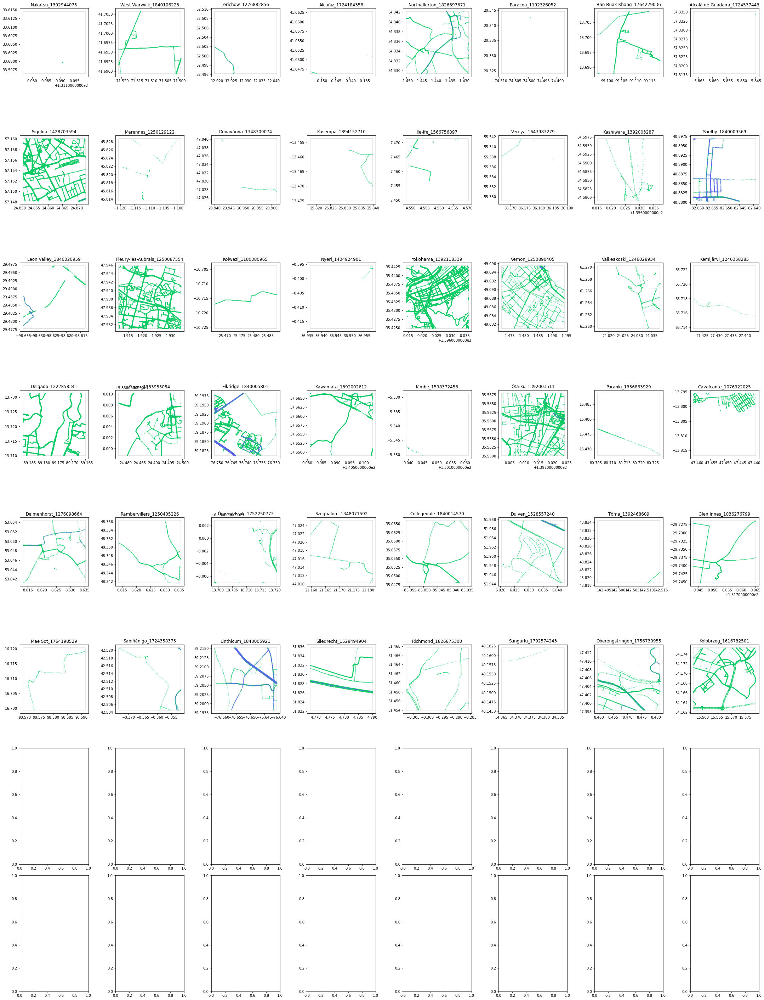

In [69]:
nrow, ncol = 8, 8
total = len(cities)
batch = nrow*ncol 
n = 10
start = n*batch
end = (n+1)*batch
if n == 11:
    end = None
df_batch = boxes.iloc[start:end]
print()

fig, axes = plt.subplots(nrow, ncol, figsize=(30, 40))

# Plot data for each attribute in a 3x3 grid with the corrected order
i = 0
for idx, box in df_batch.iterrows():
    
    city = box['city']
    city_id = box['city_id']

    # Determine the current subplot's row and column
    row, col = divmod(i, ncol)
    
    #print(f"idx: {idx}, row: {row}, col: {col}")
    
    boxes.loc[[idx], 'geometry'].plot(ax=axes[row, col], facecolor="none", edgecolor='grey', lw=0.4)
    
    points_sub = points[points['city_id'] == city_id]
    
    # points_sub.plot(ax=axes[row, col], 
    #          column='source', 
    #          cmap='Spectral',
    #          alpha=0.3, 
    #          markersize=0.3)
    
    mly = points_sub[points_sub['source'] == 'Mapillary']
    kv = points_sub[points_sub['source'] == 'KartaView']
    if mly.empty==False and kv.empty==False:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==True and kv.empty==False:
        kv.plot(ax=axes[row, col], marker='o', color='#635BFF', markersize=0.5, alpha=0.5)
    if mly.empty==False and kv.empty==True:
        mly.plot(ax=axes[row, col], marker='o', color='#07CB63', markersize=0.5, alpha=0.5)
    
    # Set title and labels
    axes[row, col].set_title(f"{city}_{city_id}")
    
    i += 1

# Adjust layout and display
plt.tight_layout()
plt.show()   

## Cities

In [60]:
wc = pd.read_csv('/Users/yujun/Data/simplemaps_worldcities_basicv1.75/worldcities.csv')

In [10]:
cities = wc[wc['id'].isin(sm['city_id'])]

In [11]:
gdf_cities = gp.GeoDataFrame(
    cities, 
    geometry=gp.points_from_xy(cities.lng, cities.lat),
    crs="EPSG:4326"
)

<AxesSubplot:>

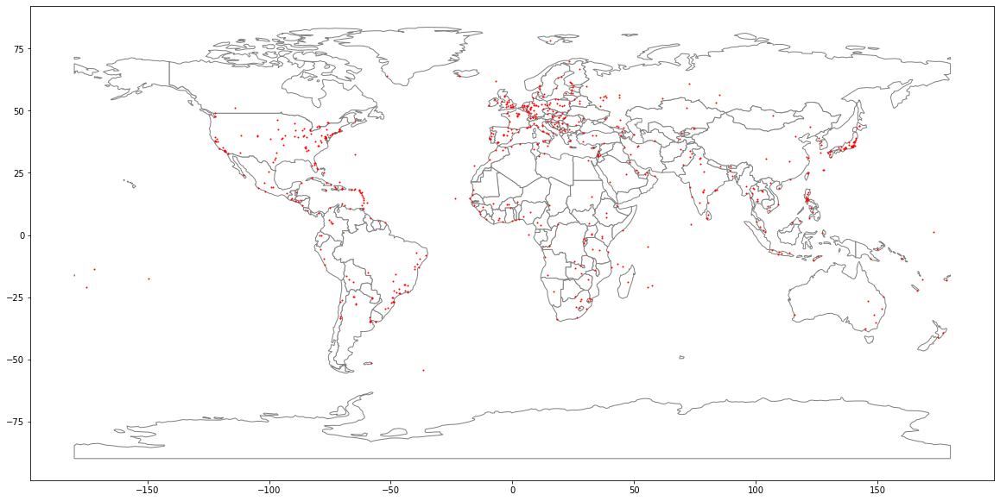

In [20]:
# create Matplotlib figure
fig, ax = plt.subplots(figsize=(20,20))

#ax.set_facecolor('black')

world = gp.read_file(gp.datasets.get_path('naturalearth_lowres'))
world.plot(ax=ax, color='white', edgecolor='grey')

# plot points on Axis ax
gdf_cities.plot(ax=ax, marker='o', color='red', markersize=1, alpha=1)

In [21]:
cities

,city,city_ascii,lat,lng,country,iso2,iso3,admin_name,capital,population,id,geometry
0,Tokyo,Tokyo,35.6839,139.7744,Japan,JP,JPN,Tōkyō,primary,39105000.0,1392685764,POINT (139.77440 35.68390)
1,Jakarta,Jakarta,-6.2146,106.8451,Indonesia,ID,IDN,Jakarta,primary,35362000.0,1360771077,POINT (106.84510 -6.21460)
3,Manila,Manila,14.6000,120.9833,Philippines,PH,PHL,Manila,primary,23971000.0,1608618140,POINT (120.98330 14.60000)
4,São Paulo,Sao Paulo,-23.5504,-46.6339,Brazil,BR,BRA,São Paulo,admin,22495000.0,1076532519,POINT (-46.63390 -23.55040)
5,Seoul,Seoul,37.5600,126.9900,South Korea,KR,KOR,Seoul,primary,22394000.0,1410836482,POINT (126.99000 37.56000)
...,...,...,...,...,...,...,...,...,...,...,...,...
41527,Vereya,Vereya,55.3333,36.1833,Russia,RU,RUS,Moskovskaya Oblast’,NaN,5123.0,1643983279,POINT (36.18330 55.33330)
41659,Bedford,Bedford,40.0456,-78.4998,United States,US,USA,Pennsylvania,NaN,5171.0,1840001396,POINT (-78.49980 40.04560)
42056,Charleville,Charleville,-26.4016,146.2383,Australia,AU,AUS,Queensland,NaN,3335.0,1036575498,POINT (146.23830 -26.40160)
42284,Charlotte Amalie,Charlotte Amalie,18.3419,-64.9332,U.S. Virgin Islands,VI,VIR,Virgin Islands,primary,NaN,1850037473,POINT (-64.93320 18.34190)


In [ ]:
cities.drop(columns=['geometry']).to_csv('/Users/yujun/Data/global_streetscapes/all/cities_covered.csv')

### Add Primosten

In [11]:
df = pd.read_csv('/Users/yujun/Data/global_streetscapes/addon/cities_addon_mly.csv').drop(columns=['Unnamed: 0'])
primosten = df[df['city_ascii'] == 'Primosten']
primosten

,city,city_ascii,lat,lng,country,iso2,iso3,admin_name,capital,population,id
214,Primošten,Primosten,43.588207,15.924824,Croatia,HR,HRV,NaN,NaN,2828.0,1


In [10]:
cities

,city,city_ascii,lat,lng,country,iso2,iso3,admin_name,capital,population,id
0,Tokyo,Tokyo,35.6839,139.7744,Japan,JP,JPN,Tōkyō,primary,39105000.0,1392685764
1,Jakarta,Jakarta,-6.2146,106.8451,Indonesia,ID,IDN,Jakarta,primary,35362000.0,1360771077
2,Manila,Manila,14.6000,120.9833,Philippines,PH,PHL,Manila,primary,23971000.0,1608618140
3,São Paulo,Sao Paulo,-23.5504,-46.6339,Brazil,BR,BRA,São Paulo,admin,22495000.0,1076532519
4,Seoul,Seoul,37.5600,126.9900,South Korea,KR,KOR,Seoul,primary,22394000.0,1410836482
...,...,...,...,...,...,...,...,...,...,...,...
671,Vereya,Vereya,55.3333,36.1833,Russia,RU,RUS,Moskovskaya Oblast’,NaN,5123.0,1643983279
672,Bedford,Bedford,40.0456,-78.4998,United States,US,USA,Pennsylvania,NaN,5171.0,1840001396
673,Charleville,Charleville,-26.4016,146.2383,Australia,AU,AUS,Queensland,NaN,3335.0,1036575498
674,Charlotte Amalie,Charlotte Amalie,18.3419,-64.9332,U.S. Virgin Islands,VI,VIR,Virgin Islands,primary,NaN,1850037473


In [12]:
cities = pd.concat([cities, primosten]).reset_index(drop=True)
cities

,city,city_ascii,lat,lng,country,iso2,iso3,admin_name,capital,population,id
0,Tokyo,Tokyo,35.683900,139.774400,Japan,JP,JPN,Tōkyō,primary,39105000.0,1392685764
1,Jakarta,Jakarta,-6.214600,106.845100,Indonesia,ID,IDN,Jakarta,primary,35362000.0,1360771077
2,Manila,Manila,14.600000,120.983300,Philippines,PH,PHL,Manila,primary,23971000.0,1608618140
3,São Paulo,Sao Paulo,-23.550400,-46.633900,Brazil,BR,BRA,São Paulo,admin,22495000.0,1076532519
4,Seoul,Seoul,37.560000,126.990000,South Korea,KR,KOR,Seoul,primary,22394000.0,1410836482
...,...,...,...,...,...,...,...,...,...,...,...
672,Bedford,Bedford,40.045600,-78.499800,United States,US,USA,Pennsylvania,NaN,5171.0,1840001396
673,Charleville,Charleville,-26.401600,146.238300,Australia,AU,AUS,Queensland,NaN,3335.0,1036575498
674,Charlotte Amalie,Charlotte Amalie,18.341900,-64.933200,U.S. Virgin Islands,VI,VIR,Virgin Islands,primary,NaN,1850037473
675,Kasempa,Kasempa,-13.459600,25.820000,Zambia,ZM,ZMB,North-Western,NaN,5622.0,1894152710


In [13]:
cities.to_csv('/Users/yujun/Data/global_streetscapes/all/cities_covered.csv')

In [14]:
cities = pd.read_csv('/Users/yujun/Data/global_streetscapes/all/cities_covered.csv').drop(columns=['Unnamed: 0'])
cities.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 677 entries, 0 to 676
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   city        677 non-null    object 
 1   city_ascii  677 non-null    object 
 2   lat         677 non-null    float64
 3   lng         677 non-null    float64
 4   country     677 non-null    object 
 5   iso2        676 non-null    object 
 6   iso3        677 non-null    object 
 7   admin_name  649 non-null    object 
 8   capital     389 non-null    object 
 9   population  668 non-null    float64
 10  id          677 non-null    int64  
dtypes: float64(3), int64(1), object(7)
memory usage: 58.3+ KB


In [15]:
cities[cities['country'] == 'Ukraine']

,city,city_ascii,lat,lng,country,iso2,iso3,admin_name,capital,population,id


In [27]:
world.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 177 entries, 0 to 176
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   pop_est     177 non-null    int64   
 1   continent   177 non-null    object  
 2   name        177 non-null    object  
 3   iso_a3      177 non-null    object  
 4   gdp_md_est  177 non-null    float64 
 5   geometry    177 non-null    geometry
dtypes: float64(1), geometry(1), int64(1), object(3)
memory usage: 8.4+ KB


In [30]:
len(world[world['continent'] == 'Europe'])

39

In [36]:
shape = world[world['continent'] == 'Europe']
gdf_clipped = gdf.clip(shape)

<AxesSubplot:>

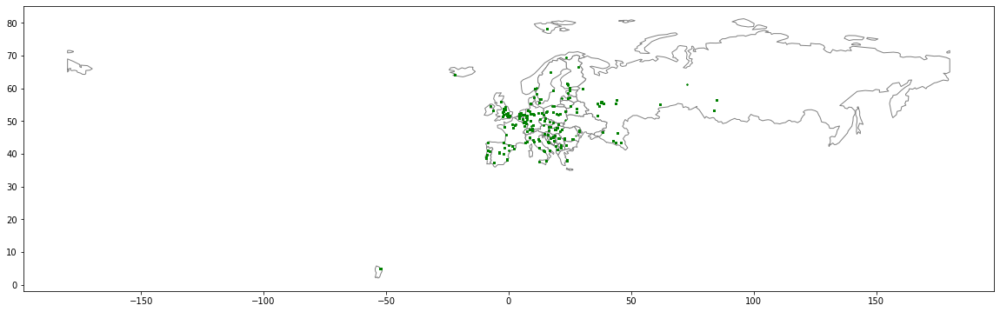

In [37]:
# create Matplotlib figure
fig, ax = plt.subplots(figsize=(20,20))

#ax.set_facecolor('black')

shape.plot(ax=ax, color='white', edgecolor='grey')

# plot points on Axis ax
gdf_clipped.plot(ax=ax, marker='o', color='green', markersize=1, alpha=1)

In [38]:
len(gdf_clipped)

2713299

In [39]:
gdf_clipped.drop(columns=['geometry']).to_csv('/Users/yujun/Data/global_streetscapes/for_qgis/europe_meta.csv')

In [40]:
gdf_clipped.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2713299 entries, 1823088 to 4040068
Data columns (total 79 columns):
 #   Column                      Non-Null Count    Dtype   
---  ------                      --------------    -----   
 0   uuid                        2713299 non-null  object  
 1   source                      2713299 non-null  object  
 2   orig_id                     2713299 non-null  int64   
 3   label_method                2713299 non-null  object  
 4   lat                         2713299 non-null  float64 
 5   lon                         2713299 non-null  float64 
 6   datetime_local              2713299 non-null  object  
 7   season                      2713299 non-null  object  
 8   width                       2713299 non-null  int64   
 9   height                      2713299 non-null  int64   
 10  heading                     2693292 non-null  float64 
 11  projection_type             2693179 non-null  object  
 12  sequenceIndex               

In [41]:
gdf_clipped[['uuid', 'source', 'orig_id', 'label_method', 'lat', 'lon', 'datetime_local', 'season', 'projection_type']].to_csv('/Users/yujun/Data/global_streetscapes/for_qgis/europe.csv')

In [7]:
sm = pd.read_csv('/Users/yujun/Data/global_streetscapes/all/tables/simplemaps.csv').drop(columns=['Unnamed: 0'])
sm.info(verbose=True, show_counts=True)

/Users/yujun/opt/anaconda3/envs/ox/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (13) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7127577 entries, 0 to 7127576
Data columns (total 14 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   uuid        7127577 non-null  object 
 1   source      7127577 non-null  object 
 2   orig_id     7127577 non-null  int64  
 3   city        7127577 non-null  object 
 4   city_ascii  7127577 non-null  object 
 5   city_id     7127577 non-null  int64  
 6   city_lat    7127577 non-null  float64
 7   city_lon    7127577 non-null  float64
 8   country     7127577 non-null  object 
 9   iso2        7126318 non-null  object 
 10  iso3        7127577 non-null  object 
 11  admin_name  6915134 non-null  object 
 12  capital     5658246 non-null  object 
 13  population  7042576 non-null  float64
dtypes: float64(3), int64(2), object(9)
memory usage: 761.3+ MB


In [16]:
cities.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 677 entries, 0 to 676
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   city        677 non-null    object 
 1   city_ascii  677 non-null    object 
 2   lat         677 non-null    float64
 3   lng         677 non-null    float64
 4   country     677 non-null    object 
 5   iso2        676 non-null    object 
 6   iso3        677 non-null    object 
 7   admin_name  649 non-null    object 
 8   capital     389 non-null    object 
 9   population  668 non-null    float64
 10  id          677 non-null    int64  
dtypes: float64(3), int64(1), object(7)
memory usage: 58.3+ KB


In [20]:
counts = sm.groupby('city_id').size().reset_index().rename(columns={0: 'img_count'})
counts

,city_id,img_count
0,1,11005
1,1004993580,57
2,1008162156,40550
3,1012126319,4872
4,1012973369,2603
...,...,...
672,1894157390,2865
673,1894950283,276
674,1901760068,41082
675,1930654114,1890


In [21]:
cities_covered = cities.join(counts.set_index('city_id'), on='id', how='left')
cities_covered

,city,city_ascii,lat,lng,country,iso2,iso3,admin_name,capital,population,id,img_count
0,Tokyo,Tokyo,35.683900,139.774400,Japan,JP,JPN,Tōkyō,primary,39105000.0,1392685764,65040
1,Jakarta,Jakarta,-6.214600,106.845100,Indonesia,ID,IDN,Jakarta,primary,35362000.0,1360771077,115913
2,Manila,Manila,14.600000,120.983300,Philippines,PH,PHL,Manila,primary,23971000.0,1608618140,84281
3,São Paulo,Sao Paulo,-23.550400,-46.633900,Brazil,BR,BRA,São Paulo,admin,22495000.0,1076532519,621
4,Seoul,Seoul,37.560000,126.990000,South Korea,KR,KOR,Seoul,primary,22394000.0,1410836482,1437
...,...,...,...,...,...,...,...,...,...,...,...,...
672,Bedford,Bedford,40.045600,-78.499800,United States,US,USA,Pennsylvania,NaN,5171.0,1840001396,68
673,Charleville,Charleville,-26.401600,146.238300,Australia,AU,AUS,Queensland,NaN,3335.0,1036575498,7
674,Charlotte Amalie,Charlotte Amalie,18.341900,-64.933200,U.S. Virgin Islands,VI,VIR,Virgin Islands,primary,NaN,1850037473,8286
675,Kasempa,Kasempa,-13.459600,25.820000,Zambia,ZM,ZMB,North-Western,NaN,5622.0,1894152710,20


In [22]:
cities_covered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 677 entries, 0 to 676
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   city        677 non-null    object 
 1   city_ascii  677 non-null    object 
 2   lat         677 non-null    float64
 3   lng         677 non-null    float64
 4   country     677 non-null    object 
 5   iso2        676 non-null    object 
 6   iso3        677 non-null    object 
 7   admin_name  649 non-null    object 
 8   capital     389 non-null    object 
 9   population  668 non-null    float64
 10  id          677 non-null    int64  
 11  img_count   677 non-null    int64  
dtypes: float64(3), int64(2), object(7)
memory usage: 63.6+ KB


In [23]:
cities_covered.to_csv('/Users/yujun/Data/global_streetscapes/all/cities_covered.csv')

## Countries

In [52]:
counts = sm.groupby('iso3').size().reset_index().rename(columns={0: 'img_count'})
counts

,iso3,img_count
0,ABW,144
1,AFG,57
2,AGO,17603
3,ALB,40550
4,AND,2584
...,...,...
207,XSV,1890
208,XWB,9543
209,ZAF,54033
210,ZMB,3161


In [53]:
counts['iso3'].nunique()

212

In [25]:
world = gp.read_file(gp.datasets.get_path('naturalearth_lowres'))

In [28]:
world.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 177 entries, 0 to 176
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   pop_est     177 non-null    int64   
 1   continent   177 non-null    object  
 2   name        177 non-null    object  
 3   iso_a3      177 non-null    object  
 4   gdp_md_est  177 non-null    float64 
 5   geometry    177 non-null    geometry
dtypes: float64(1), geometry(1), int64(1), object(3)
memory usage: 8.4+ KB


In [55]:
countries_covered = world.join(counts.set_index('iso3'), on='iso_a3', how='left')
countries_covered

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,img_count
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",3436.0
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",56284.0
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",NaN
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",110826.0
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",858312.0
...,...,...,...,...,...,...,...
172,7111024,Europe,Serbia,SRB,101800.0,"POLYGON ((18.82982 45.90887, 18.82984 45.90888...",69853.0
173,642550,Europe,Montenegro,MNE,10610.0,"POLYGON ((20.07070 42.58863, 19.80161 42.50009...",7113.0
174,1895250,Europe,Kosovo,-99,18490.0,"POLYGON ((20.59025 41.85541, 20.52295 42.21787...",NaN
175,1218208,North America,Trinidad and Tobago,TTO,43570.0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890...",3562.0


In [56]:
countries_covered.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 177 entries, 0 to 176
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   pop_est     177 non-null    int64   
 1   continent   177 non-null    object  
 2   name        177 non-null    object  
 3   iso_a3      177 non-null    object  
 4   gdp_md_est  177 non-null    float64 
 5   geometry    177 non-null    geometry
 6   img_count   162 non-null    float64 
dtypes: float64(2), geometry(1), int64(1), object(3)
memory usage: 9.8+ KB


In [57]:
countries_covered[countries_covered['img_count'].isnull()]

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,img_count
2,603253,Africa,W. Sahara,ESH,906.50,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",NaN
21,5320045,Europe,Norway,-99,364700.00,"MULTIPOLYGON (((15.14282 79.67431, 15.52255 80...",NaN
23,140,Seven seas (open ocean),Fr. S. Antarctic Lands,ATF,16.00,"POLYGON ((68.93500 -48.62500, 69.58000 -48.940...",NaN
43,67106161,Europe,France,-99,2699000.00,"MULTIPOLYGON (((-51.65780 4.15623, -52.24934 3...",NaN
68,1772255,Africa,Gabon,GAB,35980.00,"POLYGON ((11.27645 2.26105, 11.75167 2.32676, ...",NaN
69,778358,Africa,Eq. Guinea,GNQ,31770.00,"POLYGON ((9.64916 2.28387, 11.27645 2.26105, 1...",NaN
79,4543126,Asia,Palestine,PSE,21220.77,"POLYGON ((35.39756 31.48909, 34.92741 31.35344...",NaN
108,18028549,Asia,Syria,SYR,50280.00,"POLYGON ((35.71992 32.70919, 35.70080 32.71601...",NaN
112,44033874,Europe,Ukraine,UKR,352600.00,"POLYGON ((31.78599 52.10168, 32.15944 52.06125...",NaN
154,5918919,Africa,Eritrea,ERI,9169.00,"POLYGON ((36.42951 14.42211, 36.32322 14.82249...",NaN


In [94]:
counts[counts['iso3'] == 'XKS']

,iso3,img_count
206,XKS,41082


In [68]:
world.iloc[21]

pop_est                                                 5320045
continent                                                Europe
name                                                     Norway
iso_a3                                                      -99
gdp_md_est                                             364700.0
geometry      (POLYGON ((15.142820000000002 79.67431, 15.522...
Name: 21, dtype: object

In [95]:
world.loc[[174],'iso_a3'] = 'XKS'

In [99]:
wc[wc['iso3'] == 'ATF']

,city,city_ascii,lat,lng,country,iso2,iso3,admin_name,capital,population,id


In [96]:
countries_covered = world.join(counts.set_index('iso3'), on='iso_a3', how='left')
countries_covered

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,img_count
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",3436.0
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",56284.0
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",NaN
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",110826.0
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",858312.0
...,...,...,...,...,...,...,...
172,7111024,Europe,Serbia,SRB,101800.0,"POLYGON ((18.82982 45.90887, 18.82984 45.90888...",69853.0
173,642550,Europe,Montenegro,MNE,10610.0,"POLYGON ((20.07070 42.58863, 19.80161 42.50009...",7113.0
174,1895250,Europe,Kosovo,XKS,18490.0,"POLYGON ((20.59025 41.85541, 20.52295 42.21787...",41082.0
175,1218208,North America,Trinidad and Tobago,TTO,43570.0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890...",3562.0


In [97]:
countries_covered.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 177 entries, 0 to 176
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   pop_est     177 non-null    int64   
 1   continent   177 non-null    object  
 2   name        177 non-null    object  
 3   iso_a3      177 non-null    object  
 4   gdp_md_est  177 non-null    float64 
 5   geometry    177 non-null    geometry
 6   img_count   165 non-null    float64 
dtypes: float64(2), geometry(1), int64(1), object(3)
memory usage: 9.8+ KB


In [98]:
countries_covered[countries_covered['img_count'].isnull()]

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,img_count
2,603253,Africa,W. Sahara,ESH,906.50,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",NaN
23,140,Seven seas (open ocean),Fr. S. Antarctic Lands,ATF,16.00,"POLYGON ((68.93500 -48.62500, 69.58000 -48.940...",NaN
68,1772255,Africa,Gabon,GAB,35980.00,"POLYGON ((11.27645 2.26105, 11.75167 2.32676, ...",NaN
69,778358,Africa,Eq. Guinea,GNQ,31770.00,"POLYGON ((9.64916 2.28387, 11.27645 2.26105, 1...",NaN
79,4543126,Asia,Palestine,PSE,21220.77,"POLYGON ((35.39756 31.48909, 34.92741 31.35344...",NaN
108,18028549,Asia,Syria,SYR,50280.00,"POLYGON ((35.71992 32.70919, 35.70080 32.71601...",NaN
112,44033874,Europe,Ukraine,UKR,352600.00,"POLYGON ((31.78599 52.10168, 32.15944 52.06125...",NaN
154,5918919,Africa,Eritrea,ERI,9169.00,"POLYGON ((36.42951 14.42211, 36.32322 14.82249...",NaN
157,28036829,Asia,Yemen,YEM,73450.00,"POLYGON ((52.00001 19.00000, 52.78218 17.34974...",NaN
159,4050,Antarctica,Antarctica,ATA,810.00,"MULTIPOLYGON (((-48.66062 -78.04702, -48.15140...",NaN


In [100]:
countries_covered['wkt'] = countries_covered.geometry.to_wkt()
countries_covered

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,img_count,wkt
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",3436.0,"MULTIPOLYGON (((180 -16.067132663642447, 180 -..."
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",56284.0,POLYGON ((33.90371119710453 -0.950000000000000...
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",NaN,POLYGON ((-8.665589565454809 27.65642588959235...
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",110826.0,MULTIPOLYGON (((-122.84000000000003 49.0000000...
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",858312.0,MULTIPOLYGON (((-122.84000000000003 49.0000000...
...,...,...,...,...,...,...,...,...
172,7111024,Europe,Serbia,SRB,101800.0,"POLYGON ((18.82982 45.90887, 18.82984 45.90888...",69853.0,POLYGON ((18.829824792873946 45.90887235802528...
173,642550,Europe,Montenegro,MNE,10610.0,"POLYGON ((20.07070 42.58863, 19.80161 42.50009...",7113.0,POLYGON ((20.070700000000045 42.58863000000008...
174,1895250,Europe,Kosovo,XKS,18490.0,"POLYGON ((20.59025 41.85541, 20.52295 42.21787...",41082.0,POLYGON ((20.590246546680227 41.85540891928362...
175,1218208,North America,Trinidad and Tobago,TTO,43570.0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890...",3562.0,POLYGON ((-61.68000000000001 10.76000000000000...


In [104]:
countries_covered['img_count'] = countries_covered['img_count'].fillna(0)

In [105]:
countries_covered['img_count'].value_counts()

0.0         12
3436.0       1
344278.0     1
29914.0      1
57047.0      1
            ..
2119.0       1
8073.0       1
11202.0      1
1984.0       1
199.0        1
Name: img_count, Length: 166, dtype: int64

In [107]:
countries_covered = countries_covered.drop(159)

In [109]:
countries_covered[countries_covered['img_count'] == 0]

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,img_count,wkt
2,603253,Africa,W. Sahara,ESH,906.50,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",0.0,POLYGON ((-8.665589565454809 27.65642588959235...
23,140,Seven seas (open ocean),Fr. S. Antarctic Lands,ATF,16.00,"POLYGON ((68.93500 -48.62500, 69.58000 -48.940...",0.0,"POLYGON ((68.935 -48.62500000000001, 69.58 -48..."
68,1772255,Africa,Gabon,GAB,35980.00,"POLYGON ((11.27645 2.26105, 11.75167 2.32676, ...",0.0,POLYGON ((11.276449008843713 2.261050930180872...
69,778358,Africa,Eq. Guinea,GNQ,31770.00,"POLYGON ((9.64916 2.28387, 11.27645 2.26105, 1...",0.0,POLYGON ((9.649158155972628 2.2838660750377358...
79,4543126,Asia,Palestine,PSE,21220.77,"POLYGON ((35.39756 31.48909, 34.92741 31.35344...",0.0,POLYGON ((35.397560662586045 31.48908600516758...
108,18028549,Asia,Syria,SYR,50280.00,"POLYGON ((35.71992 32.70919, 35.70080 32.71601...",0.0,POLYGON ((35.71991824722275 32.709192409794866...
112,44033874,Europe,Ukraine,UKR,352600.00,"POLYGON ((31.78599 52.10168, 32.15944 52.06125...",0.0,"POLYGON ((31.78599244755525 52.1016775699397, ..."
154,5918919,Africa,Eritrea,ERI,9169.00,"POLYGON ((36.42951 14.42211, 36.32322 14.82249...",0.0,POLYGON ((36.42951000000005 14.422110000000032...
157,28036829,Asia,Yemen,YEM,73450.00,"POLYGON ((52.00001 19.00000, 52.78218 17.34974...",0.0,POLYGON ((52.00000980002224 19.000003363516058...
160,265100,Asia,N. Cyprus,-99,3600.00,"POLYGON ((32.73178 35.14003, 32.80247 35.14550...",0.0,"POLYGON ((32.73178022637745 35.14002594658844,..."


In [110]:
countries_covered.to_csv('/Users/yujun/Data/global_streetscapes/all/countries_covered.csv')

In [111]:
countries_covered[countries_covered['iso_a3'] == 'TWN']

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,img_count,wkt
140,23508428,Asia,Taiwan,TWN,1127000.0,"POLYGON ((121.77782 24.39427, 121.17563 22.790...",200393.0,"POLYGON ((121.77781782438993 24.3942735865194,..."


In [112]:
countries_covered[countries_covered['iso_a3'] == 'CHN']

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,img_count,wkt
139,1379302771,Asia,China,CHN,21140000.0,"MULTIPOLYGON (((109.47521 18.19770, 108.65521 ...",6710.0,MULTIPOLYGON (((109.47520958866365 18.19770091...


In [114]:
wc[wc['iso3'] == 'TWN']

,city,city_ascii,lat,lng,country,iso2,iso3,admin_name,capital,population,id
276,Taichung,Taichung,24.1500,120.6667,Taiwan,TW,TWN,Taichung,admin,2803894.0,1158689622
280,Kaohsiung,Kaohsiung,22.6167,120.3000,Taiwan,TW,TWN,Kaohsiung,admin,2773533.0,1158331334
285,Taipei,Taipei,25.0478,121.5319,Taiwan,TW,TWN,Taipei,NaN,2684567.0,1158881289
396,Tainan,Tainan,22.9833,120.1833,Taiwan,TW,TWN,Tainan,admin,1883831.0,1158061376
444,Zhongli,Zhongli,24.9650,121.2168,Taiwan,TW,TWN,Taoyuan,NaN,1632616.0,1158025380
1017,Changhua,Changhua,24.0667,120.5333,Taiwan,TW,TWN,Changhua,admin,750000.0,1158439005
1397,Pingtung,Pingtung,22.6761,120.4942,Taiwan,TW,TWN,Pingtung,admin,503530.0,1158209038
1517,Taoyuan District,Taoyuan District,24.9889,121.3111,Taiwan,TW,TWN,Taoyuan,admin,443273.0,1158127875
1532,Hsinchu,Hsinchu,24.8047,120.9714,Taiwan,TW,TWN,Hsinchu,admin,445635.0,1158276420
1745,Keelung,Keelung,25.1283,121.7419,Taiwan,TW,TWN,Keelung,admin,370155.0,1158820647


## Urban development stage

In [42]:
ghsl = pd.read_csv('/Users/yujun/Data/global_streetscapes/all/tables/ghsl.csv').drop(columns=['Unnamed: 0'])

In [47]:
df_ghsl = gdf[['uuid', 'lat', 'lon']].join(ghsl.set_index('uuid'), on='uuid', how='left')
df_ghsl

,uuid,lat,lon,source,orig_id,urban_code,urban_term
0,d3cca4a7-7994-47ff-9749-7df8ca7228e3,26.252018,127.713962,Mapillary,412070930384924,30,urban centre
1,33f474ab-496e-41a7-86a6-08fad8fe6638,26.236920,127.707878,Mapillary,897137344568478,30,urban centre
2,0da8bf8d-bf34-4d94-aa51-2a7a3c880f6b,26.237406,127.721257,Mapillary,266236242103987,30,urban centre
3,23c0aa2e-573b-4a3f-a65b-fb8f7349725b,26.235019,127.725635,Mapillary,646336503014104,30,urban centre
4,4f47ba8e-8437-4213-9721-8336b02ea703,26.242775,127.710308,Mapillary,404485487755735,30,urban centre
...,...,...,...,...,...,...,...
7127572,020023d1-2355-4647-853a-2bbed5994af6,43.856564,18.418365,Mapillary,820222012211515,30,urban centre
7127573,74b8922a-3d52-43a6-97bd-deb88d1acbdd,43.858246,18.420478,Mapillary,1406510156390255,30,urban centre
7127574,9891d020-8d88-4adf-9a58-9810d1361f87,43.856541,18.417796,Mapillary,2939370739685467,30,urban centre
7127575,4dfcc3a2-1892-4e03-9331-82b4d45bd4c7,43.856537,18.416889,Mapillary,1139725433139687,30,urban centre


In [48]:
df_ghsl.to_csv('/Users/yujun/Data/global_streetscapes/for_qgis/ghsl.csv')

In [49]:
gdf_ghsl = gdf[['uuid', 'lat', 'lon', 'geometry']].join(ghsl.set_index('uuid'), on='uuid', how='left')
gdf_ghsl

,uuid,lat,lon,geometry,source,orig_id,urban_code,urban_term
0,d3cca4a7-7994-47ff-9749-7df8ca7228e3,26.252018,127.713962,POINT (127.71396 26.25202),Mapillary,412070930384924,30,urban centre
1,33f474ab-496e-41a7-86a6-08fad8fe6638,26.236920,127.707878,POINT (127.70788 26.23692),Mapillary,897137344568478,30,urban centre
2,0da8bf8d-bf34-4d94-aa51-2a7a3c880f6b,26.237406,127.721257,POINT (127.72126 26.23741),Mapillary,266236242103987,30,urban centre
3,23c0aa2e-573b-4a3f-a65b-fb8f7349725b,26.235019,127.725635,POINT (127.72563 26.23502),Mapillary,646336503014104,30,urban centre
4,4f47ba8e-8437-4213-9721-8336b02ea703,26.242775,127.710308,POINT (127.71031 26.24278),Mapillary,404485487755735,30,urban centre
...,...,...,...,...,...,...,...,...
7127572,020023d1-2355-4647-853a-2bbed5994af6,43.856564,18.418365,POINT (18.41836 43.85656),Mapillary,820222012211515,30,urban centre
7127573,74b8922a-3d52-43a6-97bd-deb88d1acbdd,43.858246,18.420478,POINT (18.42048 43.85825),Mapillary,1406510156390255,30,urban centre
7127574,9891d020-8d88-4adf-9a58-9810d1361f87,43.856541,18.417796,POINT (18.41780 43.85654),Mapillary,2939370739685467,30,urban centre
7127575,4dfcc3a2-1892-4e03-9331-82b4d45bd4c7,43.856537,18.416889,POINT (18.41689 43.85654),Mapillary,1139725433139687,30,urban centre


/Users/yujun/opt/anaconda3/envs/ox/lib/python3.10/site-packages/geopandas/plotting.py:644: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


CPU times: user 6min 41s, sys: 12.9 s, total: 6min 54s
Wall time: 7min 4s


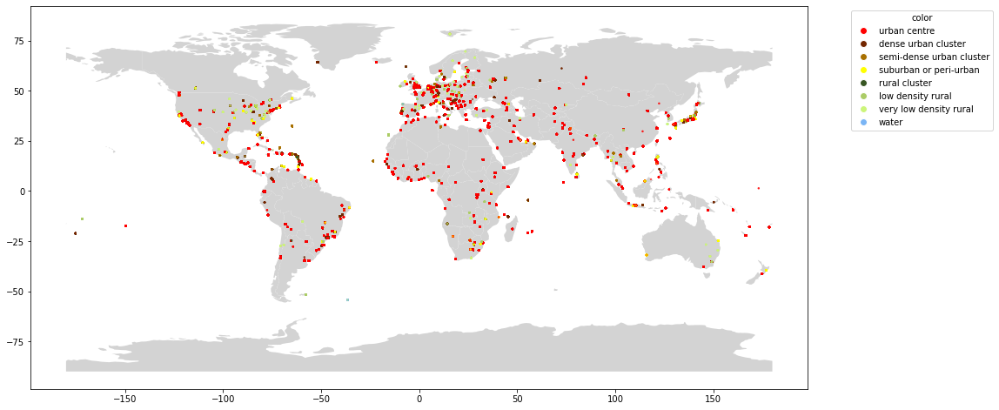

In [50]:
%%time
from matplotlib.lines import Line2D

# create Matplotlib figure
fig, ax = plt.subplots(figsize=(16,16))

world = gp.read_file(gp.datasets.get_path('naturalearth_lowres'))
world.plot(ax=ax, color='lightgrey')

colors = {'urban centre':(1,0,0), 
          'dense urban cluster':(0.45,0.15,0), 
          'semi-dense urban cluster':(0.66,0.44,0), 
          'suburban or peri-urban':(1,1,0), 
          'rural cluster':(0.216,0.337,0.137), 
          'low density rural':(0.67,0.8,0.4), 
          'very low density rural':(0.8,0.96,0.48),
          'water':(0.48,0.71,0.96)}

# plot points on Axis ax
gdf_ghsl.plot(ax=ax, 
                column='urban_term', 
                color=gdf_ghsl['urban_term'].map(colors),
                marker='o',  
                markersize=2, 
                alpha=0.5)

handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in colors.items()]
ax.legend(title='color', handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left')


## Sources

In [9]:
sm['source'].value_counts()

Mapillary    6314998
KartaView     812579
Name: source, dtype: int64

In [11]:
sm_mly = sm[sm['source'] == 'Mapillary']
sm_kv = sm[sm['source'] == 'KartaView']
print('Number of cities covered:', sm['city_id'].nunique())
print('Number of cities with Mapillary images:', sm_mly['city_id'].nunique())
print('Number of cities with KartaView images:', sm_kv['city_id'].nunique())

Number of cities covered: 677
Number of cities with Mapillary images: 664
Number of cities with KartaView images: 250


# For QGIS:
- city coverage
- proportional symbol map for europe
- ghsl coverage

In [4]:
world = gp.read_file(gp.datasets.get_path('naturalearth_lowres'))
world.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 177 entries, 0 to 176
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   pop_est     177 non-null    int64   
 1   continent   177 non-null    object  
 2   name        177 non-null    object  
 3   iso_a3      177 non-null    object  
 4   gdp_md_est  177 non-null    float64 
 5   geometry    177 non-null    geometry
dtypes: float64(1), geometry(1), int64(1), object(3)
memory usage: 8.4+ KB


In [5]:
world.to_file('/Users/yujun/Data/global_streetscapes/for_qgis/world.shp') 

In [6]:
world.rename(columns={'rename': 'a'})

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."
...,...,...,...,...,...,...
172,7111024,Europe,Serbia,SRB,101800.0,"POLYGON ((18.82982 45.90887, 18.82984 45.90888..."
173,642550,Europe,Montenegro,MNE,10610.0,"POLYGON ((20.07070 42.58863, 19.80161 42.50009..."
174,1895250,Europe,Kosovo,-99,18490.0,"POLYGON ((20.59025 41.85541, 20.52295 42.21787..."
175,1218208,North America,Trinidad and Tobago,TTO,43570.0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."


# tmp

In [6]:
df = pd.read_csv('/Users/yujun/Data/global_streetscapes/all/tables/osm.csv').drop(columns=['Unnamed: 0'])
df.info(verbose=True, show_counts=True)

/Users/yujun/opt/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (9,14,15,19,24,25,26) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7127577 entries, 0 to 7127576
Data columns (total 27 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   uuid          7127577 non-null  object 
 1   source        7127577 non-null  object 
 2   orig_id       7127577 non-null  int64  
 3   snap_dist     6836061 non-null  float64
 4   u             6836061 non-null  float64
 5   v             6836061 non-null  float64
 6   key           6836061 non-null  float64
 7   osmid         6836061 non-null  object 
 8   oneway        6836061 non-null  object 
 9   lanes         4517857 non-null  object 
 10  name          6050158 non-null  object 
 11  highway       6836061 non-null  object 
 12  type_highway  6718353 non-null  object 
 13  maxspeed      3509559 non-null  object 
 14  junction      60448 non-null    object 
 15  length        6836061 non-null  float64
 16  from          6836061 non-null  float64
 17  to            6836061 non-n

In [7]:
df.type_highway.value_counts()

drive         5429169
walk          1049488
cycle          131447
walk/cycle     105974
others           2275
Name: type_highway, dtype: int64

In [12]:
import numpy as np
d = {
    'driving surface': 'for driving',
    'walking surface': 'for walking',
    'cycling surface': 'for cycling',
    'walking/cycling surface': 'for walking/cycling',
    'others': 'others',
    np.nan: np.nan
}
df['type_highway'] = df['type_highway'].apply(lambda x: d[x])
df.type_highway.value_counts()

for driving            5429169
for walking            1049488
for cycling             131447
for walking/cycling     105974
others                    2275
Name: type_highway, dtype: int64

In [8]:
df.highway.value_counts()

residential                                    1262146
secondary                                      1068634
primary                                         923188
footway                                         917213
tertiary                                        861588
                                                ...   
['footway', 'residential', 'living_street']          1
['motorway_link', 'secondary']                       1
['steps', 'residential', 'pedestrian']               1
['primary_link', 'residential']                      1
['secondary', 'tertiary']                            1
Name: highway, Length: 224, dtype: int64

In [14]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7127577 entries, 0 to 7127576
Data columns (total 27 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   uuid          7127577 non-null  object 
 1   source        7127577 non-null  object 
 2   orig_id       7127577 non-null  int64  
 3   snap_dist     6836061 non-null  float64
 4   u             6836061 non-null  float64
 5   v             6836061 non-null  float64
 6   key           6836061 non-null  float64
 7   osmid         6836061 non-null  object 
 8   oneway        6836061 non-null  object 
 9   lanes         4517857 non-null  object 
 10  name          6050158 non-null  object 
 11  highway       6836061 non-null  object 
 12  type_highway  6718353 non-null  object 
 13  maxspeed      3509559 non-null  object 
 14  junction      60448 non-null    object 
 15  length        6836061 non-null  float64
 16  from          6836061 non-null  float64
 17  to            6836061 non-n

In [13]:
df.to_csv('/Users/yujun/Data/global_streetscapes/all/tables/osm.csv')

In [15]:
df = pd.read_csv('/Users/yujun/Data/global_streetscapes/all/tables/simplemaps.csv')
df.info()

/Users/yujun/opt/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (13) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7127577 entries, 0 to 7127576
Data columns (total 16 columns):
 #   Column      Dtype  
---  ------      -----  
 0   Unnamed: 0  int64  
 1   uuid        object 
 2   source      object 
 3   orig_id     int64  
 4   city        object 
 5   city_ascii  object 
 6   city_id     int64  
 7   city_lat    float64
 8   city_lon    float64
 9   country     object 
 10  iso2        object 
 11  iso3        object 
 12  admin_name  object 
 13  capital     object 
 14  population  float64
 15  continent   object 
dtypes: float64(3), int64(3), object(10)
memory usage: 870.1+ MB


In [16]:
df = pd.read_csv('/Users/yujun/Data/global_streetscapes/all/tables/metadata.csv')
df.info(verbose=True, show_counts=True)

/Users/yujun/opt/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (14,17,18,19,21,23,28,29,31,33,35,36,37,38,39,42,43,44,45,46,47,48,49,54,60,61,64,65,70,73,74,75,77,78) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7127577 entries, 0 to 7127576
Data columns (total 79 columns):
 #   Column                      Non-Null Count    Dtype  
---  ------                      --------------    -----  
 0   Unnamed: 0                  7127577 non-null  int64  
 1   uuid                        7127577 non-null  object 
 2   source                      7127577 non-null  object 
 3   orig_id                     7127577 non-null  int64  
 4   label_method                7127577 non-null  object 
 5   lat                         7127577 non-null  float64
 6   lon                         7127577 non-null  float64
 7   datetime_local              7127577 non-null  object 
 8   season                      7127577 non-null  object 
 9   width                       7127577 non-null  int64  
 10  height                      7127577 non-null  int64  
 11  heading                     6892465 non-null  float64
 12  projection_type             7054788 non-null  object 
 1